# Import the necessary Python libraries, such as pandas, numpy, and sklearn

In [41]:
import pandas as pd
import matplotlib.pyplot as mp
import seaborn as sns
from sklearn import preprocessing
import numpy as np
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import silhouette_score,accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc
from sklearn.model_selection import GridSearchCV,train_test_split,cross_val_score
from sklearn.cluster import KMeans
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.neighbors import KNeighborsClassifier



# Load the Datasets

In [42]:
data = pd.read_csv('Dataset/Dataset.txt')
data_attack = pd.read_csv('Dataset/Attack_types.txt')

In [43]:
data.head(5)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack_category,occurance
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21


In [44]:
data_attack.head()

,attack_category attack_type
0,apache2 dos
1,back dos
2,mailbomb dos
3,processtable dos
4,snmpgetattack dos


In [45]:
# Seperating attack types and categories
data_attack[['attack_category', 'attack_type']] = data_attack['attack_category attack_type'].str.split(' ', expand=True)

In [46]:
data_attack.head()

,attack_category attack_type,attack_category,attack_type
0,apache2 dos,apache2,dos
1,back dos,back,dos
2,mailbomb dos,mailbomb,dos
3,processtable dos,processtable,dos
4,snmpgetattack dos,snmpgetattack,dos


# Merges the data on attack category and attack types between two data sets and Preprocess the data

In [47]:
data_attack.drop('attack_category attack_type',axis = 1, inplace=True)


In [48]:
data_attack.head()

,attack_category,attack_type
0,apache2,dos
1,back,dos
2,mailbomb,dos
3,processtable,dos
4,snmpgetattack,dos


In [49]:
# Create new DataFrame with 'Attack category' column
att_cat = data[['attack_category']].copy()

In [50]:
# View the resulting DataFrame
att_cat.head(10)

,attack_category
0,normal
1,normal
2,neptune
3,normal
4,normal
5,neptune
6,neptune
7,neptune
8,neptune
9,neptune


In [51]:
data.head(10)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack_category,occurance
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21
5,0,tcp,private,REJ,0,0,0,0,0,0,...,0.07,0.07,0.00,0.00,0.00,0.00,1.00,1.00,neptune,21
6,0,tcp,private,S0,0,0,0,0,0,0,...,0.04,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21
7,0,tcp,private,S0,0,0,0,0,0,0,...,0.06,0.07,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21
8,0,tcp,remote_job,S0,0,0,0,0,0,0,...,0.09,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21
9,0,tcp,private,S0,0,0,0,0,0,0,...,0.05,0.06,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21


In [52]:
data = data.merge(data_attack, on='attack_category', how='left')

In [53]:
data.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack_category,occurance,attack_type
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20,NaN
1,0,udp,other,SF,146,0,0,0,0,0,...,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15,NaN
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19,dos
3,0,tcp,http,SF,232,8153,0,0,0,0,...,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21,NaN
4,0,tcp,http,SF,199,420,0,0,0,0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21,NaN


In [54]:
data['attack_category'].value_counts()['normal']

67343

In [55]:
"""checking null values"""
nulls =data.isnull().sum()

In [56]:
print(nulls , data.shape)

duration                           0
protocol_type                      0
service                            0
flag                               0
src_bytes                          0
dst_bytes                          0
land                               0
wrong_fragment                     0
urgent                             0
hot                                0
num_failed_logins                  0
logged_in                          0
num_compromised                    0
root_shell                         0
su_attempted                       0
num_root                           0
num_file_creations                 0
num_shells                         0
num_access_files                   0
num_outbound_cmds                  0
is_host_login                      0
is_guest_login                     0
count                              0
srv_count                          0
serror_rate                        0
srv_serror_rate                    0
rerror_rate                        0
s

In [57]:
"""replacing all the null values in attack type with normal because no attack occured"""
data['attack_type'] = data['attack_type'].replace(np.nan,'normal')

In [58]:
data.head(10)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack_category,occurance,attack_type
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20,normal
1,0,udp,other,SF,146,0,0,0,0,0,...,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15,normal
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19,dos
3,0,tcp,http,SF,232,8153,0,0,0,0,...,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21,normal
4,0,tcp,http,SF,199,420,0,0,0,0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21,normal
5,0,tcp,private,REJ,0,0,0,0,0,0,...,0.07,0.00,0.00,0.00,0.00,1.00,1.00,neptune,21,dos
6,0,tcp,private,S0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21,dos
7,0,tcp,private,S0,0,0,0,0,0,0,...,0.07,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21,dos
8,0,tcp,remote_job,S0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21,dos
9,0,tcp,private,S0,0,0,0,0,0,0,...,0.06,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21,dos


In [59]:
data['attack_type'].value_counts()['normal']

67343

In [60]:
data.tail()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack_category,occurance,attack_type
125979,0,tcp,private,S0,0,0,0,0,0,0,...,0.06,0.00,0.0,1.00,1.0,0.00,0.0,neptune,20,dos
125980,8,udp,private,SF,105,145,0,0,0,0,...,0.01,0.01,0.0,0.00,0.0,0.00,0.0,normal,21,normal
125981,0,tcp,smtp,SF,2231,384,0,0,0,0,...,0.06,0.00,0.0,0.72,0.0,0.01,0.0,normal,18,normal
125982,0,tcp,klogin,S0,0,0,0,0,0,0,...,0.05,0.00,0.0,1.00,1.0,0.00,0.0,neptune,20,dos
125983,0,tcp,ftp_data,SF,151,0,0,0,0,0,...,0.03,0.30,0.0,0.00,0.0,0.00,0.0,normal,21,normal


In [61]:
"""dropping attack category column bc it is no longer needed"""
data.drop('attack_category' ,axis = 1, inplace=True)

In [62]:
data.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,occurance,attack_type
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,20,normal
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,15,normal
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,19,dos
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,21,normal
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,21,normal


In [63]:
print([f"{i} = {data[i].unique()}" for i in data if data[i].dtype == 'object'])

["protocol_type = ['tcp' 'udp' 'icmp']", "service = ['ftp_data' 'other' 'private' 'http' 'remote_job' 'name' 'netbios_ns'\n 'eco_i' 'mtp' 'telnet' 'finger' 'domain_u' 'supdup' 'uucp_path' 'Z39_50'\n 'smtp' 'csnet_ns' 'uucp' 'netbios_dgm' 'urp_i' 'auth' 'domain' 'ftp'\n 'bgp' 'ldap' 'ecr_i' 'gopher' 'vmnet' 'systat' 'http_443' 'efs' 'whois'\n 'imap4' 'iso_tsap' 'echo' 'klogin' 'link' 'sunrpc' 'login' 'kshell'\n 'sql_net' 'time' 'hostnames' 'exec' 'ntp_u' 'discard' 'nntp' 'courier'\n 'ctf' 'ssh' 'daytime' 'shell' 'netstat' 'pop_3' 'nnsp' 'IRC' 'pop_2'\n 'printer' 'tim_i' 'pm_dump' 'red_i' 'netbios_ssn' 'rje' 'X11' 'urh_i'\n 'http_8001' 'aol' 'http_2784' 'tftp_u' 'harvest']", "flag = ['SF' 'S0' 'REJ' 'RSTR' 'SH' 'RSTO' 'S1' 'RSTOS0' 'S3' 'S2' 'OTH']", "attack_type = ['normal' 'dos' 'r2l' 'probe' 'u2r']"]


In [64]:
attack_type = ['normal' 'dos' 'r2l' 'probe' 'u2r']

In [65]:
data.shape

(125984, 43)

In [66]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 125984 entries, 0 to 125983
Data columns (total 43 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   duration                     125984 non-null  int64  
 1   protocol_type                125984 non-null  object 
 2   service                      125984 non-null  object 
 3   flag                         125984 non-null  object 
 4   src_bytes                    125984 non-null  int64  
 5   dst_bytes                    125984 non-null  int64  
 6   land                         125984 non-null  int64  
 7   wrong_fragment               125984 non-null  int64  
 8   urgent                       125984 non-null  int64  
 9   hot                          125984 non-null  int64  
 10  num_failed_logins            125984 non-null  int64  
 11  logged_in                    125984 non-null  int64  
 12  num_compromised              125984 non-null  int64  
 13 

In [67]:
data.describe()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,occurance
count,125984.000000,1.259840e+05,1.259840e+05,125984.000000,125984.000000,125984.000000,125984.000000,125984.000000,125984.000000,125984.000000,...,125984.000000,125984.000000,125984.000000,125984.000000,125984.000000,125984.000000,125984.000000,125984.000000,125984.000000,125984.000000
mean,287.120150,4.556280e+04,1.978262e+04,0.000198,0.022685,0.000111,0.204423,0.001222,0.395709,0.279353,...,115.643391,0.521276,0.082944,0.148424,0.032540,0.284478,0.278511,0.118822,0.120229,19.503707
std,2604.402926,5.870075e+06,4.021094e+06,0.014085,0.253519,0.014365,2.149887,0.045237,0.489004,23.941038,...,110.702693,0.448952,0.188915,0.309041,0.112559,0.444780,0.445665,0.306546,0.319447,2.292028
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,10.000000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000
50%,0.000000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,63.000000,0.510000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
75%,0.000000,2.760000e+02,5.160000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,255.000000,1.000000,0.070000,0.060000,0.020000,1.000000,1.000000,0.000000,0.000000,21.000000
max,42908.000000,1.379964e+09,1.309937e+09,1.000000,3.000000,3.000000,77.000000,5.000000,1.000000,7479.000000,...,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,21.000000


In [68]:
duplicate_rows_df = data[data.duplicated()]
print("number of duplicate rows: ", duplicate_rows_df)

number of duplicate rows:          duration protocol_type service flag  src_bytes  dst_bytes  land  \
6087           0           tcp   imap4   SF          0          0     0   
12293          0           tcp   imap4   SF          0          0     0   
17675         41           tcp   imap4   SF       1334        162     0   
17875          0           tcp   imap4   S1       1492     649186     0   
21548          0           tcp   imap4   SH          0          0     0   
26928          0          icmp   eco_i   SF          8          0     0   
34013          0          icmp   eco_i   SF          8          0     0   
58310          0           tcp   imap4   SH          0          0     0   
64560          0           tcp   imap4   SH          0          0     0   
64813          0           tcp   imap4   SF          0          0     0   
79823          0          icmp   eco_i   SF          8          0     0   
79867          0          icmp   ecr_i   SF          8          0     0  

In [69]:
data.count()

duration                       125984
protocol_type                  125984
service                        125984
flag                           125984
src_bytes                      125984
dst_bytes                      125984
land                           125984
wrong_fragment                 125984
urgent                         125984
hot                            125984
num_failed_logins              125984
logged_in                      125984
num_compromised                125984
root_shell                     125984
su_attempted                   125984
num_root                       125984
num_file_creations             125984
num_shells                     125984
num_access_files               125984
num_outbound_cmds              125984
is_host_login                  125984
is_guest_login                 125984
count                          125984
srv_count                      125984
serror_rate                    125984
srv_serror_rate                125984
rerror_rate 

In [70]:
data.shape

(125984, 43)

In [71]:
data = data.drop_duplicates()
df = data
X_train, X_test, y_train, y_test = train_test_split(df.drop('attack_type', axis=1), df['attack_type'], test_size=0.3, random_state=42)


In [72]:
data.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,occurance,attack_type
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,20,normal
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,15,normal
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,19,dos
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,21,normal
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,21,normal


In [73]:
data.shape

(125964, 43)

In [74]:
# Label encode categorical columns and standardize it
data[['service', 'protocol_type', 'flag']] = data[['service', 'protocol_type', 'flag']].apply(LabelEncoder().fit_transform)


In [75]:
data.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,occurance,attack_type
0,0,1,20,9,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,20,normal
1,0,2,44,9,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,15,normal
2,0,1,49,5,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,19,dos
3,0,1,24,9,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,21,normal
4,0,1,24,9,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,21,normal


In [76]:
x = data.drop('attack_type',axis=1)
y = data['attack_type']

In [77]:
"""Before standardization"""
for col in x.select_dtypes(exclude='object').columns:
     print(f"Feature: {col}\nMean: {x[col].mean()}\nMedian: {x[col].median()}\nMode: {x[col].mode()[0]}\nVariance: {x[col].var()}\nStandard Deviation: {x[col].std()}\n")

Feature: duration
Mean: 287.16516623797276
Median: 0.0
Mode: 0
Variance: 6783978.785773607
Standard Deviation: 2604.607222936619

Feature: protocol_type
Mean: 1.053277126798133
Median: 1.0
Mode: 1
Variance: 0.18193800720904185
Standard Deviation: 0.4265419172942348

Feature: service
Mean: 31.227660283890636
Median: 24.0
Mode: 24
Variance: 267.20629380104646
Standard Deviation: 16.346445907323293

Feature: flag
Mean: 6.979851386110317
Median: 9.0
Mode: 9
Variance: 7.232908574889431
Standard Deviation: 2.6894067328854203

Feature: src_bytes
Mean: 45569.99812644882
Median: 44.0
Mode: 0
Variance: 34463250244731.562
Standard Deviation: 5870540.881786921

Feature: dst_bytes
Mean: 19780.527619002256
Median: 0.0
Mode: 0
Variance: 16171760942942.4
Standard Deviation: 4021412.8043440655

Feature: land
Mean: 0.00019846940395668603
Median: 0.0
Mode: 0
Variance: 0.00019843158915664575
Standard Deviation: 0.014086574784405389

Feature: wrong_fragment
Mean: 0.02268902226032835
Median: 0.0
Mode: 0
Var

In [78]:
#standardize it now
standard = preprocessing.scale(x)
standardized_x = pd.DataFrame(standard, columns= x.columns)
standardized_x.head(10)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,occurance
0,-0.110253,-0.124905,-0.686859,0.751153,-0.007679,-0.004919,-0.014089,-0.08949,-0.007736,-0.095079,...,-0.818965,-0.782294,-0.280305,0.070186,-0.289115,-0.639564,-0.624902,-0.224553,-0.376402,0.216288
1,-0.110253,2.219539,0.781356,0.751153,-0.007738,-0.004919,-0.014089,-0.08949,-0.007736,-0.095079,...,-1.035763,-1.160960,2.736741,2.368492,-0.289115,-0.639564,-0.624902,-0.387651,-0.376402,-1.967359
2,-0.110253,-0.124905,1.087234,-0.736170,-0.007763,-0.004919,-0.014089,-0.08949,-0.007736,-0.095079,...,-0.809932,-0.938215,-0.174444,-0.480113,-0.289115,1.608679,1.618875,-0.387651,-0.376402,-0.220441
3,-0.110253,-0.124905,-0.442157,0.751153,-0.007723,-0.002891,-0.014089,-0.08949,-0.007736,-0.095079,...,1.258683,1.066483,-0.439097,-0.383002,0.066229,-0.572117,-0.602464,-0.387651,-0.345100,0.653017
4,-0.110253,-0.124905,-0.442157,0.751153,-0.007729,-0.004814,-0.014089,-0.08949,-0.007736,-0.095079,...,1.258683,1.066483,-0.439097,-0.480113,-0.289115,-0.639564,-0.624902,-0.387651,-0.376402,0.653017
5,-0.110253,-0.124905,1.087234,-2.223492,-0.007763,-0.004919,-0.014089,-0.08949,-0.007736,-0.095079,...,-0.873164,-1.005039,-0.068582,-0.480113,-0.289115,-0.639564,-0.624902,2.874295,2.753802,0.653017
6,-0.110253,-0.124905,1.087234,-0.736170,-0.007763,-0.004919,-0.014089,-0.08949,-0.007736,-0.095079,...,-0.963497,-1.071862,-0.174444,-0.480113,-0.289115,1.608679,1.618875,-0.387651,-0.376402,0.653017
7,-0.110253,-0.124905,1.087234,-0.736170,-0.007763,-0.004919,-0.014089,-0.08949,-0.007736,-0.095079,...,-0.909297,-1.027313,-0.068582,-0.480113,-0.289115,1.608679,1.618875,-0.387651,-0.376402,0.653017
8,-0.110253,-0.124905,1.209585,-0.736170,-0.007763,-0.004919,-0.014089,-0.08949,-0.007736,-0.095079,...,-0.837031,-0.960490,-0.174444,-0.480113,-0.289115,1.608679,1.618875,-0.387651,-0.376402,0.653017
9,-0.110253,-0.124905,1.087234,-0.736170,-0.007763,-0.004919,-0.014089,-0.08949,-0.007736,-0.095079,...,-0.927364,-1.049588,-0.121513,-0.480113,-0.289115,1.608679,1.618875,-0.387651,-0.376402,0.653017


In [79]:
"""Univariate Analysis and After Standardization"""
for col in standardized_x.select_dtypes(exclude='object').columns:
    print(f"Feature: {col}\nMean: {standardized_x[col].mean()}\nMedian: {standardized_x[col].median()}\nMode: {standardized_x[col].mode()[0]}\nVariance: {standardized_x[col].var()}\nStandard Deviation: {standardized_x[col].std()}\n")

Feature: duration
Mean: 1.3355800804744976e-15
Median: -0.11025320961468675
Mode: -0.11025320961468675
Variance: 1.0000079388418461
Standard Deviation: 1.000003969413045

Feature: protocol_type
Mean: -8.049674402146335e-16
Median: -0.12490528156052198
Mode: -0.12490528156052198
Variance: 1.0000079388378915
Standard Deviation: 1.0000039694110676

Feature: service
Mean: -1.673879527747602e-15
Median: -0.4421566017732566
Mode: -0.4421566017732566
Variance: 1.0000079388397083
Standard Deviation: 1.000003969411976

Feature: flag
Mean: 1.089203845580937e-15
Median: 0.7511532591891754
Mode: 0.7511532591891754
Variance: 1.0000079388383938
Standard Deviation: 1.0000039694113187

Feature: src_bytes
Mean: -3.863942438742782e-16
Median: -0.0077550228768770895
Mode: -0.007762517957064785
Variance: 1.0000079388395715
Standard Deviation: 1.0000039694119076

Feature: dst_bytes
Mean: -1.2434511068976707e-15
Median: -0.004918820100913004
Mode: -0.004918820100913004
Variance: 1.00000793883768
Standard De

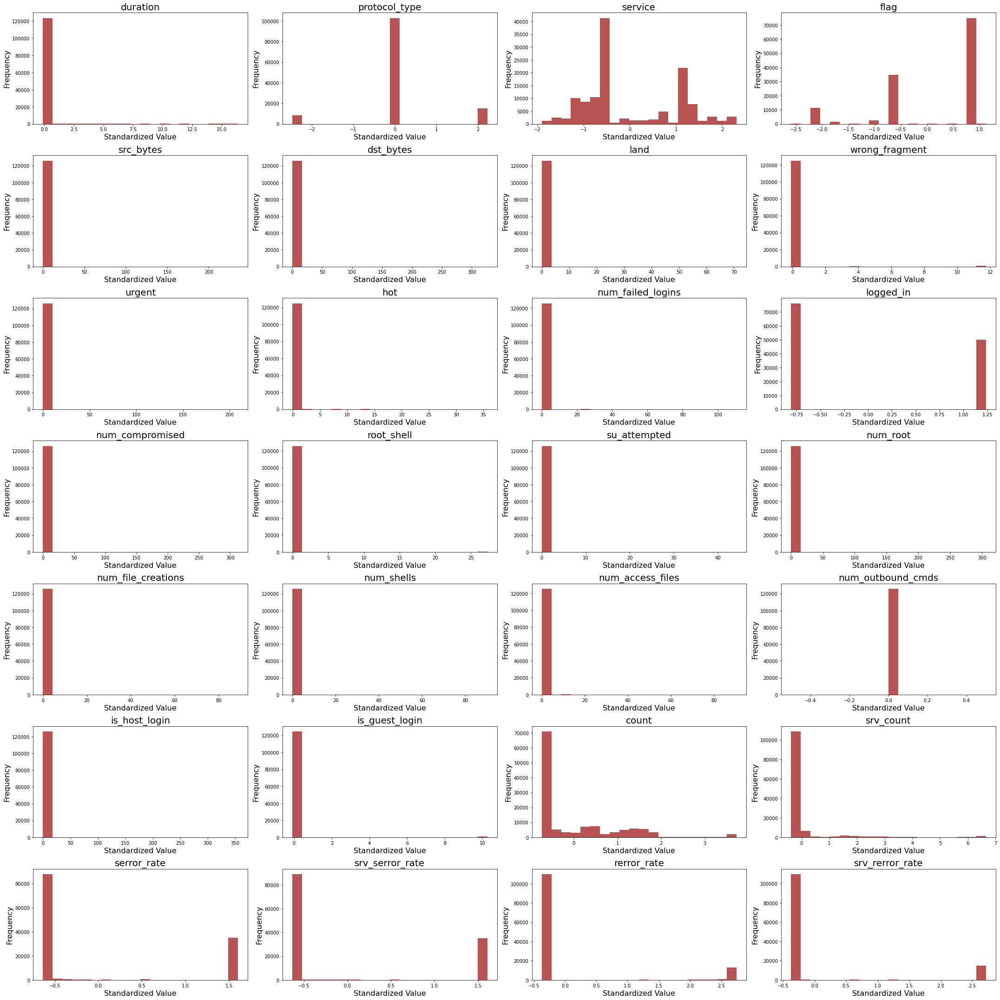

In [80]:
# Plot histograms for each feature in the standardized data
fig, axes = mp.subplots(nrows=7, ncols=4, figsize=(30, 30))

for col, ax in zip(standardized_x.columns, axes.flatten()):
    if standardized_x[col].dtype != object:
        ax.hist(standardized_x[col], bins=20, color='brown', alpha=0.8)
        ax.set_title(col, fontsize=20)
        ax.set_xlabel('Standardized Value', fontsize=16)
        ax.set_ylabel('Frequency', fontsize=16)

mp.tight_layout()
mp.show()


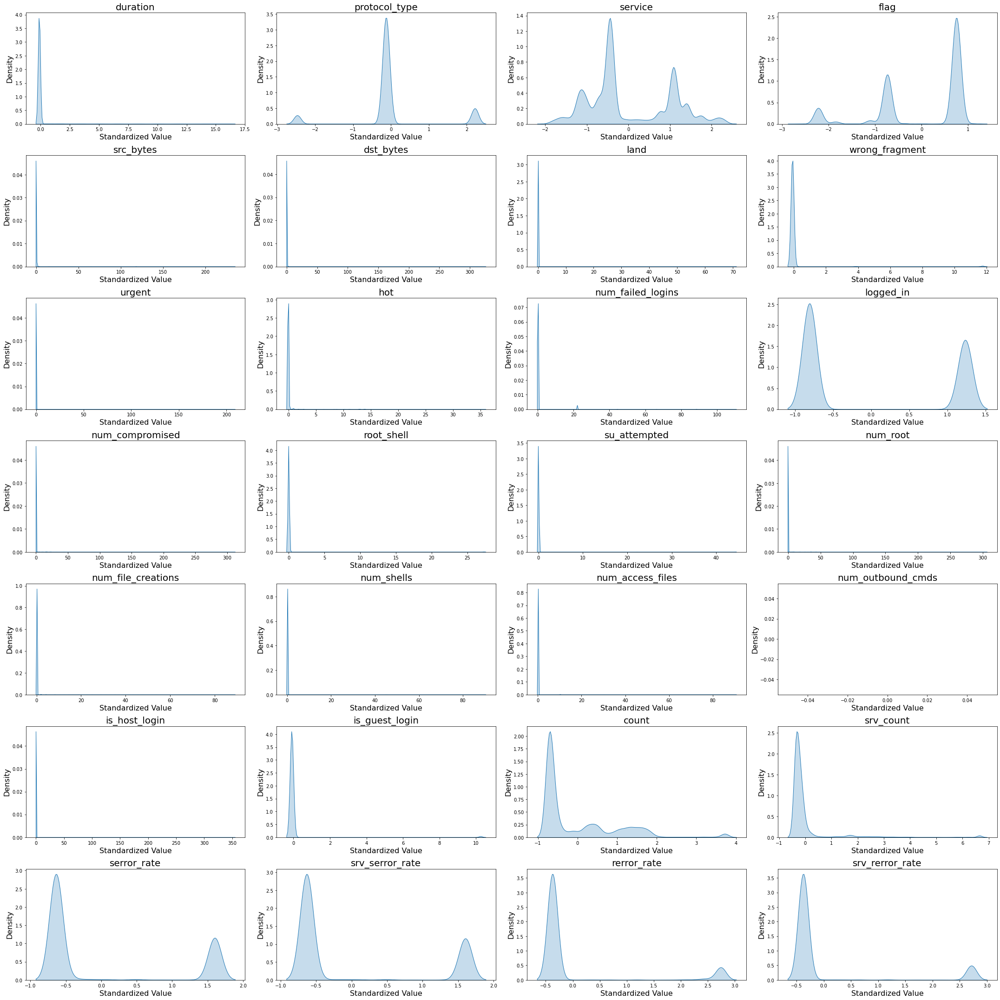

In [81]:
fig, axes = mp.subplots(nrows=7, ncols=4, figsize=(30, 30))
for col, ax in zip(standardized_x.columns, axes.flatten()):
    if standardized_x[col].dtype != object:
        sns.kdeplot(standardized_x[col], shade=True, ax=ax, warn_singular=False)
        ax.set_title(col, fontsize=20)
        ax.set_xlabel('Standardized Value', fontsize=16)
        ax.set_ylabel('Density', fontsize=16)

mp.tight_layout()
mp.show()


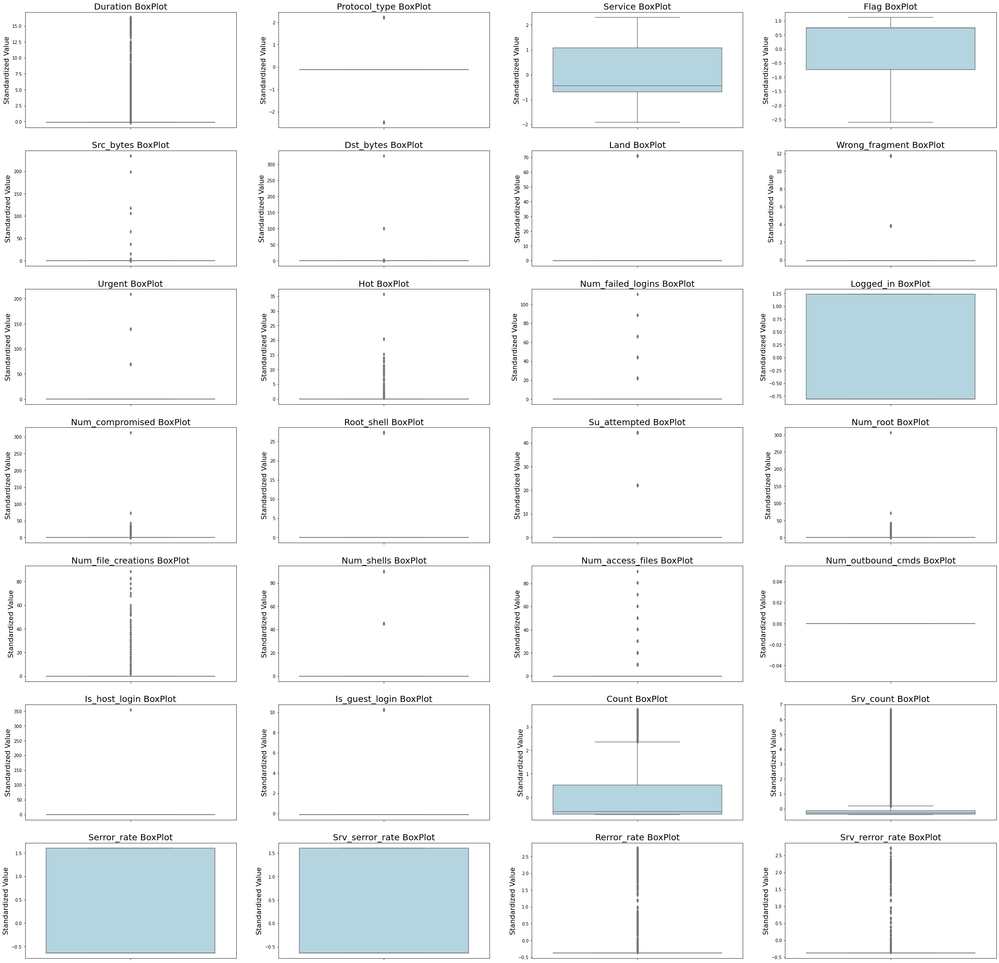

In [82]:
# Handling Outliers
fig, axes = mp.subplots(nrows=7, ncols=4, figsize=(40, 40))
for col, ax in zip(standardized_x.columns, axes.flatten()):
    if standardized_x[col].dtype != object:
        sns.boxplot(y=standardized_x[col], ax=ax, color='lightblue')
        ax.set_title(col.capitalize()+" BoxPlot", fontsize=20)
        ax.set_ylabel('Standardized Value', fontsize=16)
# plt.tight_layout()
mp.show()


In [103]:
X_train, X_test, y_train, y_test =train_test_split(standardized_x,y,test_size=0.3,random_state =0)
X_train.shape, X_test.shape

((88174, 42), (37790, 42))

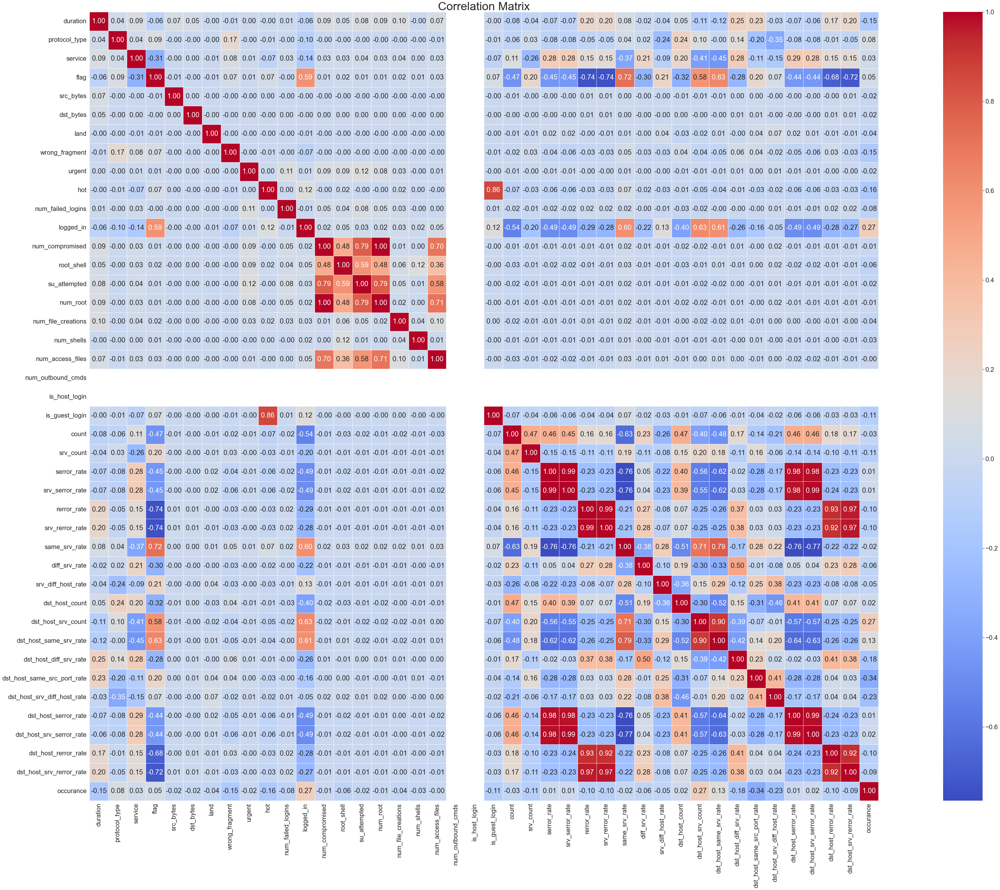

In [104]:
# Create correlation matrix
corr = X_train.corr()
# Customize heatmap
sns.set(font_scale=2)
sns.set_style("whitegrid")
mp.figure(figsize=(80,50))
sns.heatmap(corr, annot=True, fmt='.2f', 
            cmap='coolwarm', square=True, linewidths=1)
mp.title('Correlation Matrix', fontsize=40)
mp.show()


In [105]:
def correlation(dataset, threshold):
    corr_matrix = dataset.corr().abs()
    upper_tri = np.triu(corr_matrix, k=1) # exclude diagonal
    col_corr = np.where(upper_tri > threshold)
    return set([corr_matrix.columns[i] for i in col_corr[0]])


In [106]:
corr_features = correlation(X_train, 0.80)
print(corr_features)
len(set(corr_features))

{'dst_host_serror_rate', 'serror_rate', 'dst_host_srv_count', 'dst_host_rerror_rate', 'hot', 'rerror_rate', 'num_compromised', 'srv_rerror_rate', 'srv_serror_rate'}


9

In [107]:
Xtrnew = X_train.drop(corr_features,axis=1)
Xtestnew = X_test.drop(corr_features,axis=1)
Xtrnew.shape

(88174, 33)

In [108]:
Xtestnew.shape

(37790, 33)

# Classification of Cyber Attacks Using Decision Tree Algorithm

In [116]:
# Train a decision tree classifier using entropy criterion
tree_entropy = DecisionTreeClassifier(criterion='entropy')
tree_entropy.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy')

In [117]:
# Evaluate the accuracy of the decision tree classifier using entropy criterion
y_pred_entropy = tree_entropy.predict(X_test)
accuracy_entropy = accuracy_score(y_test, y_pred_entropy)

In [118]:
# Calculate evaluation metrics for the decision tree classifier with entropy criterion
prec_entropy = precision_score(y_test, y_pred_entropy, average='weighted')
rec_entropy = recall_score(y_test, y_pred_entropy, average='weighted')
f1_entropy = f1_score(y_test, y_pred_entropy, average='weighted')

In [119]:
# Train a decision tree classifier using gini criterion
tree_gini = DecisionTreeClassifier(criterion='gini')
tree_gini.fit(X_train, y_train)

DecisionTreeClassifier()

In [120]:
# Evaluate the accuracy of the decision tree classifier using gini criterion
y_pred_gini = tree_gini.predict(X_test)
accuracy_gini = accuracy_score(y_test, y_pred_gini)

In [121]:
# Calculate evaluation metrics for the decision tree classifier with gini criterion
prec_gini = precision_score(y_test, y_pred_gini, average='weighted')
rec_gini = recall_score(y_test, y_pred_gini, average='weighted')
f1_gini = f1_score(y_test, y_pred_gini, average='weighted')


In [133]:
# Print the evaluation metrics
print("Decision tree classifier with entropy criterion:")
print(f"Accuracy: {round(accuracy_entropy*100,2)}")
print(f"Precision: {round(prec_entropy*100,2)}")
print(f"Recall: {round(rec_entropy*100,2)}")
print(f"F1 score: {round(f1_entropy*100,2)}")

print("\nDecision tree classifier with gini criterion:")
print(f"Accuracy: {round(accuracy_gini*100,2)}")
print(f"Precision: {round(prec_gini*100,2)}")
print(f"Recall: {round(rec_gini*100,2)}")
print(f"F1 score: {round(f1_gini*100,2)}")




Decision tree classifier with entropy criterion:
Accuracy: 99.8
Precision: 99.81
Recall: 99.8
F1 score: 99.8

Decision tree classifier with gini criterion:
Accuracy: 99.82
Precision: 99.83
Recall: 99.82
F1 score: 99.82


In [59]:
# plot the decision tree
mp.figure(figsize=(200,200))
plot_tree(tree_entropy, filled=True, fontsize=80)
mp.title('Decision Tree - Entropy Criterion')
mp.show()


#  Classification of Cyber Attacks Using K-Nearest Neighbors Algorithm

In [132]:
# Create KNN classifiers with k=3 and k=5
knn3 = KNeighborsClassifier(n_neighbors=3)
knn5 = KNeighborsClassifier(n_neighbors=5)

In [124]:
# Fit KNN models on the training data
knn3.fit(X_train, y_train)
knn5.fit(X_train, y_train)

KNeighborsClassifier()

In [125]:
# Make predictions on the test data
y_pred_3 = knn3.predict(X_test)
y_pred_5 = knn5.predict(X_test)

In [126]:
# Evaluate model performance
accuracy_3 = accuracy_score(y_test, y_pred_3)
precision_3 = precision_score(y_test, y_pred_3, average='weighted')
recall_3 = recall_score(y_test, y_pred_3, average='weighted')
f1_3 = f1_score(y_test, y_pred_3, average='weighted')

In [127]:
accuracy_5 = accuracy_score(y_test, y_pred_5)
precision_5 = precision_score(y_test, y_pred_5, average='weighted')
recall_5 = recall_score(y_test, y_pred_5, average='weighted')
f1_5 = f1_score(y_test, y_pred_5, average='weighted')

In [131]:
# Print model performance metrics
print("KNN Classifier with k=3:")
print(f"Accuracy: {round(accuracy_3*100,2)}")
print(f"Precision: {round(precision_3*100,2)}")
print(f"Recall: {round(recall_3*100,2)}")
print(f"F1 score: {round(f1_3*100,2)}\n")

print("KNN Classifier with k=5:")
print(f"Accuracy: {round(accuracy_5*100,2)}")
print(f"Precision: {round(precision_5*100,2)}")
print(f"Recall: {round(recall_5*100,2)}")
print(f"F1 score: {round(f1_5*100,2)}")

KNN Classifier with k=3:
Accuracy: 99.86
Precision: 99.86
Recall: 99.86
F1 score: 99.86

KNN Classifier with k=5:
Accuracy: 99.83
Precision: 99.83
Recall: 99.83
F1 score: 99.83


# Classification of Cyber Attacks Using Artificial Neural Networks (ANN)

## Build an MLP classifier using sklearn.neural_network.MLPClassifier() and train it on the training data

In [62]:
#Build an MLP classifier
mlp = MLPClassifier(hidden_layer_sizes=(100,), activation='relu', solver='adam', max_iter=1000, random_state=42)

#Train the MLP classifier on the training data
mlp.fit(X_trian, y_train)
MLPClassifier(max_iter=1000, random_state=42)

MLPClassifier(max_iter=1000, random_state=42)

## Evaluate the performance of the MLP classifier on the test data using metrics such as accuracy, precision, recall, and F1-score.

In [63]:
#Make predictions on the test data
y_pred = mlp.predict(X_test)

In [65]:
#Evaluate the performance of the MLP classifier on the test data
print("Initial Model Metrics:")
print("Accuracy:", accuracy_score(y_test, y_pred)*100)
print("Precision:", precision_score(y_test, y_pred, average='weighted')*100)
print("Recall:", recall_score(y_test, y_pred, average='weighted')*100)
print("F1-score:", f1_score(y_test, y_pred, average='weighted')*100)

Initial Model Metrics:
Accuracy: 99.8015347975655
Precision: 99.79916922975896
Recall: 99.8015347975655
F1-score: 99.79978961608641


## Fine-tune the MLP classifier by adjusting its hyperparameters, such as the number of hidden layers, and the number of neurons per layer.

In [66]:
#Fine-tune the MLP classifier by adding another hidden layer with 50 neurons
mlp = MLPClassifier(hidden_layer_sizes=(100, 50), activation='relu', solver='adam', max_iter=1000, random_state=42)
#Train the fine-tuned MLP classifier on the training data
mlp_finetuned = MLPClassifier(hidden_layer_sizes=(50,50,50), max_iter=500, activation='relu', solver='adam', random_state=42)
mlp_finetuned.fit(Xtrnew, y_train)
MLPClassifier(hidden_layer_sizes=(50, 50, 50), max_iter=500, random_state=42)

MLPClassifier(hidden_layer_sizes=(50, 50, 50), max_iter=500, random_state=42)

In [68]:
y_pred_finetuned = mlp_finetuned.predict(Xtestnew)
print("Accuracy (fine-tuned MLP):", accuracy_score(y_test, y_pred_finetuned)*100)
print("Precision (fine-tuned MLP):", precision_score(y_test, y_pred_finetuned, average='weighted')*100)
print("Recall (fine-tuned MLP):", recall_score(y_test, y_pred_finetuned, average='weighted')*100)
print("F1-score (fine-tuned MLP):", f1_score(y_test, y_pred_finetuned, average='weighted')*100)

Accuracy (fine-tuned MLP): 99.83858163535326
Precision (fine-tuned MLP): 99.83850096037926
Recall (fine-tuned MLP): 99.83858163535326
F1-score (fine-tuned MLP): 99.83851866832426


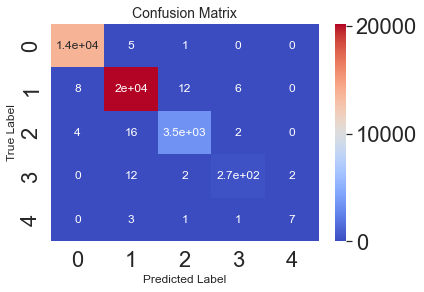

In [71]:
"""Draw a confusion matrix of the best MLP"""
conf_mat = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_mat, annot=True, cmap='coolwarm', annot_kws={"size": 12})
mp.title('Confusion Matrix', fontsize=14)
mp.xlabel('Predicted Label', fontsize=12)
mp.ylabel('True Label', fontsize=12)
mp.show()

# k-Means. Clustering

In [72]:
data.columns

Index(['duration', 'protocol_type', 'service', 'flag', 'src_bytes',
       'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot',
       'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
       'su_attempted', 'num_root', 'num_file_creations', 'num_shells',
       'num_access_files', 'num_outbound_cmds', 'is_host_login',
       'is_guest_login', 'count', 'srv_count', 'serror_rate',
       'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate',
       'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count',
       'dst_host_srv_count', 'dst_host_same_srv_rate',
       'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate',
       'dst_host_srv_diff_host_rate', 'dst_host_serror_rate',
       'dst_host_srv_serror_rate', 'dst_host_rerror_rate',
       'dst_host_srv_rerror_rate', 'occurance', 'attack_type'],
      dtype='object')

In [73]:
#Clustering
#Scaling the features using standardization.
clusterData= data.drop(columns=['attack_type'])
clusterData.columns

Index(['duration', 'protocol_type', 'service', 'flag', 'src_bytes',
       'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot',
       'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
       'su_attempted', 'num_root', 'num_file_creations', 'num_shells',
       'num_access_files', 'num_outbound_cmds', 'is_host_login',
       'is_guest_login', 'count', 'srv_count', 'serror_rate',
       'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate',
       'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count',
       'dst_host_srv_count', 'dst_host_same_srv_rate',
       'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate',
       'dst_host_srv_diff_host_rate', 'dst_host_serror_rate',
       'dst_host_srv_serror_rate', 'dst_host_rerror_rate',
       'dst_host_srv_rerror_rate', 'occurance'],
      dtype='object')

In [74]:
# Drop the constant feature from the dataset
constant_feature_idx = [19]  # Index of the constant feature
data.drop(data.columns[constant_feature_idx], axis=1, inplace=True)

In [75]:
# Split the data into feature matrix and target vector
X = data.drop('attack_type', axis=1)
y = data['attack_type']

In [76]:
# Apply feature scaling to the feature matrix
scaler = StandardScaler()
standardized_x = scaler.fit_transform(X)

In [77]:
# Select the top 2 features using SelectKBest
selector = SelectKBest(f_classif, k=2)
selector.fit(standardized_x, y)
X_selected = selector.transform(standardized_x)
selected_features = X.columns[selector.get_support()]

# Print the selected features
print(selected_features)


Index(['same_srv_rate', 'dst_host_srv_serror_rate'], dtype='object')


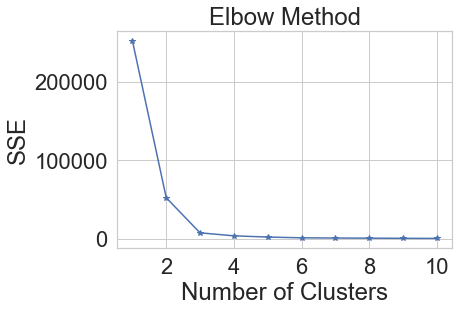

In [79]:
"""Applying K-means clustering on various k values and choosing the most optimal using elbow method
Calculate the intra-cluster variance for each K value"""
variance_values = []
k_range = range(1, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
    kmeans.fit(X_selected)
    labels = kmeans.labels_
    centers = kmeans.cluster_centers_
    variance = 0
    for i in range(k):
        variance += np.sum((X_selected[labels == i] - centers[i]) ** 2)
    variance_values.append(variance)

# Plot the elbow graph
mp.clf()
mp.plot(k_range, variance_values, marker='*')
mp.title('Elbow Method')
mp.xlabel('Number of Clusters')
mp.ylabel('SSE')
mp.show()

In [81]:
"""Apply K-means clustering with the optimal number of clusters"""
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
clusters = kmeans.fit_predict(X_selected)

In [91]:
# Perform k-means clustering with the optimal number of clusters
optimal_k = 5
kmeans = KMeans(n_clusters=optimal_k, n_init=10, random_state=0)
kmeans.fit(X_selected)

KMeans(n_clusters=5, random_state=0)

In [92]:
# Assign the cluster labels to the data points
cluster_labels = kmeans.labels_

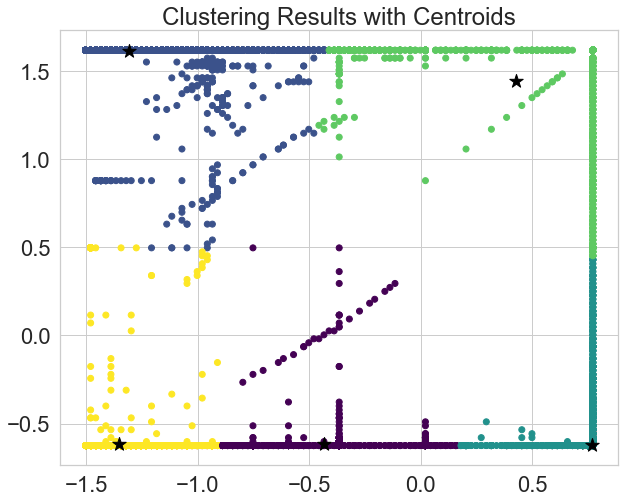

In [93]:
# Add centroids to the plot
mp.figure(figsize=(10,8))
mp.scatter(X_selected[:,0], X_selected[:,1], c=cluster_labels, cmap='viridis')
mp.scatter(kmeans.cluster_centers_[:,0], kmeans.cluster_centers_[:,1], s=200, marker='*', c='black')
mp.title('Clustering Results with Centroids')
mp.show()


In [94]:
print(cluster_labels)

[2 4 1 ... 2 1 2]


In [85]:
"""Evaluate the quality of the clustering using silhouette analysis"""
silhouette_avg = silhouette_score(X_selected, cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.9313336576318797


# THE END AND BEST OF LUCK FOR THE NEXT 